In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import  OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [8]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 1000)

In [41]:
df = pd.read_excel("D:\DataScience\DataSet\Speed Dating Data.xlsx", encoding='ISO-8859-1')
df.describe()

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field_cd,race,imprace,imprelig,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
count,8378.000000,8368.000000,8378.000000,8220.000000,8378.000000,8274.000000,8305.000000,8289.000000,8289.000000,8289.000000,8280.000000,8271.000000,8249.000000,8378.000000,8166.000000,8091.000000,8072.000000,8018.000000,7656.000000,7302.000000,8128.000000,8060.000000,7993.000000,8283.000000,8296.000000,8315.000000,8299.000000,8299.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8248.000000,8147.000000,8072.000000,8053.000000,7999.000000,7637.000000,7282.000000,8109.000000,8040.000000,7974.000000,7176.000000,3959.000000,3959.000000
mean,11.350919,283.863767,0.164717,0.196010,0.395799,26.364999,2.756653,22.495347,17.396867,20.270759,17.459714,10.685375,11.845930,0.419551,6.190411,7.175256,7.369301,6.400599,6.778409,5.474870,6.134498,5.208251,1.960215,26.358928,7.662488,2.757186,3.784793,3.651645,6.421403,4.574244,6.243168,7.784885,6.984039,6.710036,5.729141,3.879323,5.750181,7.679081,5.294800,6.777267,7.915840,6.821161,7.848730,5.626481,4.331681,5.534433,6.187971,7.171705,7.366571,6.399675,6.778774,5.472329,6.130127,5.207525,0.951843,3.212695,0.776206,0.977772
std,5.995903,158.584899,0.370947,0.303539,0.489051,3.563648,1.230689,12.569802,7.044003,6.782895,6.085526,6.126544,6.362746,0.493515,1.950305,1.740575,1.550501,1.954078,1.794080,2.156163,1.841258,2.129354,0.245925,3.566763,3.758935,1.230905,2.845708,2.805237,2.622646,2.804207,2.422682,1.757602,2.055403,2.266090,2.571208,2.620735,2.504027,2.009840,2.527949,2.237223,1.702702,2.158058,1.794287,2.612222,2.719240,1.734822,1.950344,1.741646,1.551680,1.954990,1.795916,2.157787,1.841129,2.131630,0.990201,2.448540,1.612993,1.383331
min,1.000000,1.000000,0.000000,-0.830000,0.000000,18.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,18.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000000,154.000000,0.000000,-0.020000,0.000000,24.000000,2.000000,15.000000,15.000000,17.390000,15.000000,5.000000,9.520000,0.000000,5.000000,6.000000,6.000000,5.000000,6.000000,4.000000,5.000000,4.000000,2.000000,24.000000,5.000000,2.000000,1.000000,1.000000,4.000000,2.000000,5.000000,7.000000,6.000000,5.000000,4.000000,2.000000,4.000000,7.000000,3.000000,5.000000,7.000000,5.000000,7.000000,4.000000,2.000000,5.000000,5.000000,6.000000,6.000000,5.000000,6.000000,4.000000,5.000000,4.000000,0.000000,2.000000,0.000000,0.000000
50%,11.000000,281.000000,0.000000,0.210000,0.000000,26.000000,2.000000,20.000000,18.370000,20.000000,18.000000,10.000000,10.640000,0.000000,6.000000,7.000000,7.000000,7.000000,7.000000,6.000000,6.000000,5.000000,2.000000,26.000000,8.000000,2.000000,3.000000,3.000000,7.000000,4.000000,6.000000,8.000000,7.000000,7.000000,6.000000,3.000000,6.000000,8.000000,6.000000,7.000000,8.000000,7.000000,8.000000,6.000000,4.000000,6.000000,6.000000,7.000000,7.000000,7.000000,7.000000,6.000000,6.000000,5.000000,0.000000,3.000000,0.000000,1.000000
75%,15.000000,408.000000,0.000000,0.430000,1.000000,28.000000,4.000000,25.000000,20.000000,23.810000,20.000000,15.000000,16.000000,1.000000,8.000000,8.000000,8.000000,8.000000,8.000000,7.000000,7.000000,7.000000,2.000000,28.00

In [43]:
df.shape

(8378, 62)

In [44]:
df.head(100)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,...,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,...,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,...,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,...,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,...,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,...,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1,16.0,0,0.15,1,25.0,2.0,50.00,0.00,30.00,...,6.0,4.0,6.0,NaN,6.0,1.0,2.0,NaN,NaN,NaN
96,1,17.0,0,0.41,1,30.0,2.0,35.00,15.00,25.00,...,8.0,6.0,9.0,NaN,7.0,1.0,2.0,NaN,NaN,NaN
97,1,18.0,0,0.07,1,27.0,2.0,33.33,11.11,11.11,...,6.0,4.0,5.0,NaN,5.0,5.0,2.0,NaN,NaN,NaN
98,1,19.0,1,0.49,1,28.0,2.0,50.00,0.00,25.00,...,9.0,9.0,9.0,9.0,9.0,9.0,2.0,NaN,NaN,NaN


In [45]:
df.tail()

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,...,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
8373,21,526.0,0,0.64,0,26.0,3.0,10.0,10.0,30.0,...,5.0,5.0,NaN,NaN,2.0,5.0,0.0,3.0,2.0,0.0
8374,21,527.0,0,0.71,0,24.0,6.0,50.0,20.0,10.0,...,8.0,4.0,4.0,NaN,4.0,4.0,0.0,3.0,2.0,0.0
8375,21,528.0,0,-0.46,0,29.0,3.0,40.0,10.0,30.0,...,8.0,8.0,8.0,NaN,6.0,5.0,0.0,3.0,2.0,0.0
8376,21,529.0,0,0.62,0,22.0,4.0,10.0,25.0,25.0,...,5.0,4.0,NaN,5.0,5.0,5.0,0.0,3.0,2.0,0.0
8377,21,530.0,0,0.01,0,22.0,4.0,20.0,20.0,10.0,...,6.0,4.0,8.0,1.0,4.0,5.0,0.0,3.0,2.0,0.0


In [35]:
list(df.columns)

['wave',
 'pid',
 'match',
 'int_corr',
 'samerace',
 'age_o',
 'race_o',
 'pf_o_att',
 'pf_o_sin',
 'pf_o_int',
 'pf_o_fun',
 'pf_o_amb',
 'pf_o_sha',
 'dec_o',
 'attr_o',
 'sinc_o',
 'intel_o',
 'fun_o',
 'amb_o',
 'shar_o',
 'like_o',
 'prob_o',
 'met_o',
 'age',
 'field',
 'field_cd',
 'race',
 'imprace',
 'imprelig',
 'from',
 'income',
 'career',
 'sports',
 'tvsports',
 'exercise',
 'dining',
 'museums',
 'art',
 'hiking',
 'gaming',
 'clubbing',
 'reading',
 'tv',
 'theater',
 'movies',
 'concerts',
 'music',
 'shopping',
 'yoga',
 'exphappy',
 'attr',
 'sinc',
 'intel',
 'fun',
 'amb',
 'shar',
 'like',
 'prob',
 'met',
 'match_es',
 'you_call',
 'them_cal']

In [42]:
df["movies"].head(10)

0    10.0
1    10.0
2    10.0
3    10.0
4    10.0
5    10.0
6    10.0
7    10.0
8    10.0
9    10.0
Name: movies, dtype: float64

In [44]:
df["movies"] = df["movies"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)



,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [45]:
df["sports"] = df["sports"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [46]:
df["tvsports"] = df["tvsports"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [53]:
df["theater"] = df["theater"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [ ]:
df["gaming"] = df["gaming"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

In [58]:
df["shopping"] = df["shopping"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,Very,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,Very,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,Very,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,Very,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,Very,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,Very,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,Very,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,Very,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,Very,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,Very,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [59]:
df["concerts"] = df["concerts"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [62]:
df["music"] = df["music"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [61]:
df["exercise"] = df["exercise"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,Few,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,Few,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,Few,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,Few,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,Few,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,Few,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,Few,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,Few,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,Few,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,9.0,Very,Few,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [55]:
df["clubbing"] = df["clubbing"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,9.0,Few,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [56]:
df["tv"] = df["tv"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [52]:
df["gaming"] = df["gaming"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,Few,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [51]:
df["dining"] = df["dining"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,Very,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [50]:
df["art"] = df["art"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,Few,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [49]:
df["hiking"] = df["hiking"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,Moderately,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [48]:
df["museums"] = df["museums"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,Few,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [47]:
df["reading"] = df["reading"].apply(lambda x: "Very" if x > 6
                               else "Moderately" if x > 3
                               else "Few" if x > 0
                               else None)
df.head(10)

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,race,imprace,imprelig,from,income,career,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
0,1,11.0,0,0.14,0,27.0,2.0,35.00,20.00,20.00,20.00,0.00,5.00,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,1.0,1.0
1,1,12.0,0,0.54,0,22.0,2.0,60.00,0.00,0.00,40.00,0.00,0.00,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,1.0,1.0
2,1,13.0,1,0.16,1,22.0,4.0,19.00,18.00,19.00,18.00,14.00,12.00,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,1.0,1.0
3,1,14.0,1,0.61,0,23.0,2.0,30.00,5.00,15.00,40.00,5.00,5.00,1,7.0,8.0,9.0,8.0,9.0,8.0,7.0,7.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,7.0,6.0,8.0,7.0,6.0,2.0,4.0,1.0,1.0
4,1,15.0,1,0.21,0,24.0,3.0,30.00,10.00,20.00,10.00,10.00,20.00,1,8.0,7.0,9.0,6.0,9.0,7.0,8.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,7.0,7.0,6.0,6.0,6.0,6.0,2.0,4.0,1.0,1.0
5,1,16.0,0,0.25,0,25.0,2.0,50.00,0.00,30.00,10.00,0.00,10.00,1,7.0,7.0,8.0,8.0,7.0,7.0,7.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,4.0,6.0,4.0,6.0,5.0,2.0,4.0,1.0,1.0
6,1,17.0,0,0.34,0,30.0,2.0,35.00,15.00,25.00,10.00,5.00,10.00,0,3.0,6.0,7.0,5.0,8.0,7.0,2.0,1.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,7.0,4.0,6.0,7.0,6.0,5.0,2.0,4.0,1.0,1.0
7,1,18.0,0,0.50,0,27.0,2.0,33.33,11.11,11.11,11.11,11.11,22.22,0,6.0,7.0,5.0,6.0,8.0,6.0,7.0,5.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,4.0,9.0,7.0,6.0,5.0,6.0,6.0,7.0,NaN,4.0,1.0,1.0
8,1,19.0,1,0.28,0,28.0,2.0,50.00,0.00,25.00,10.00,0.00,15.00,1,7.0,7.0,8.0,8.0,8.0,9.0,6.5,8.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,7.0,6.0,8.0,9.0,8.0,8.0,7.0,7.0,2.0,4.0,1.0,1.0
9,1,20.0,0,-0.36,0,24.0,2.0,100.00,0.00,0.00,0.00,0.00,0.00,0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,2.0,21.0,Law,1.0,4.0,2.0,4.0,Chicago,"69,487.00",lawyer,Very,Few,8.0,9.0,1.0,1.0,5.0,1.0,5.0,Moderately,9.0,1.0,Very,10.0,9.0,8.0,1.0,3.0,5.0,6.0,6.0,8.0,10.0,8.0,6.0,6.0,2.0,4.0,1.0,1.0


In [63]:
df.to_excel(r'D:\DataScience\DataSet\SpeedDating_hobbies.xlsx', index = False)

In [97]:
df1.value_counts()

Very          6944
moderately    1132
Little         176
rr             126
Name: movies, dtype: int64

In [80]:
df.isnull().sum()

wave           0
pid           10
match          0
int_corr     158
samerace       0
age_o        104
race_o        73
pf_o_att      89
pf_o_sin      89
pf_o_int      89
pf_o_fun      98
pf_o_amb     107
pf_o_sha     129
dec_o          0
attr_o       212
sinc_o       287
intel_o      306
fun_o        360
amb_o        722
shar_o      1076
like_o       250
prob_o       318
met_o        385
age           95
field         63
field_cd      82
race          63
imprace       79
imprelig      79
from          79
income      4099
career        89
sports       108
tvsports     108
exercise     108
dining       108
museums      108
art          108
hiking       108
gaming       108
clubbing     108
reading      108
tv           108
theater      108
movies       108
concerts     108
music        108
shopping     108
yoga         108
exphappy     130
attr         231
sinc         306
intel        325
fun          379
amb          741
shar        1096
like         269
prob         338
met          4

In [64]:
df = pd.read_excel("D:\DataScience\DataSet\SpeedDating_hobbies.xlsx", encoding='ISO-8859-1')
df.head()

,match,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga
0,0,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
1,0,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
2,1,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
3,1,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
4,1,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few


In [65]:
df["match"] = df["match"].apply(lambda x: "Yes" if x == 1
                               else "No" if x == 0
                               else None)
df.head(10)

,match,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga
0,No,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
1,No,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
2,Yes,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
3,Yes,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
4,Yes,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
5,No,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
6,No,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
7,No,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
8,Yes,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
9,No,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few


In [67]:
df.head()

,match,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga
0,No,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
1,No,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
2,Yes,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
3,Yes,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few
4,Yes,Very,Few,Very,Very,Few,Few,Moderately,Few,Moderately,Moderately,Very,Few,Very,Very,Very,Very,Few


ValueError: zero-size array to reduction operation minimum which has no identity

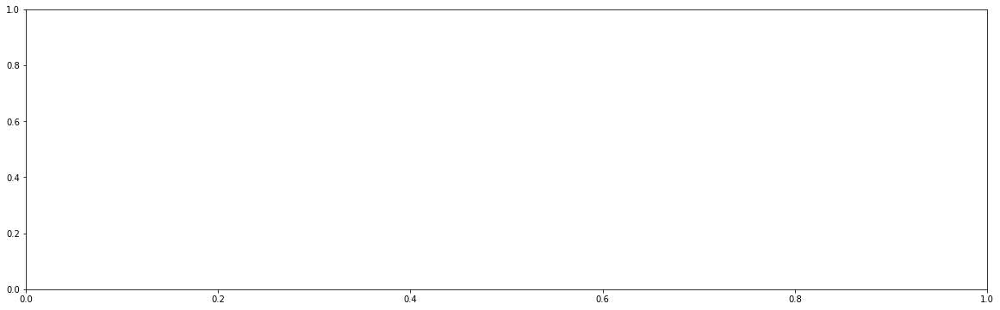

In [66]:
corr = df.corr()
f, ax = plt.subplots(figsize=(20, 6))
ax = sns.heatmap(corr, annot=True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

ValueError: zero-size array to reduction operation minimum which has no identity

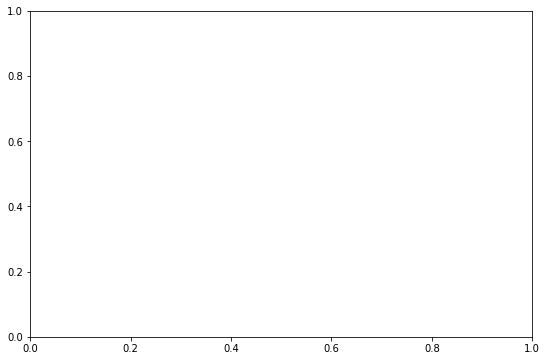

In [73]:
corr = df.corr()
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(corr, annot=True, ax=ax)

In [69]:
df.isnull().sum()

match         0
sports      108
tvsports    108
exercise    108
dining      108
museums     126
art         126
hiking      126
gaming      167
clubbing    126
reading     108
tv          108
theater     126
movies      126
concerts    126
music       108
shopping    108
yoga        144
dtype: int64

In [70]:
df.shape


(8378, 18)

In [71]:
df1 = df.dropna()

In [72]:
df1.shape

(8157, 18)

ValueError: zero-size array to reduction operation minimum which has no identity

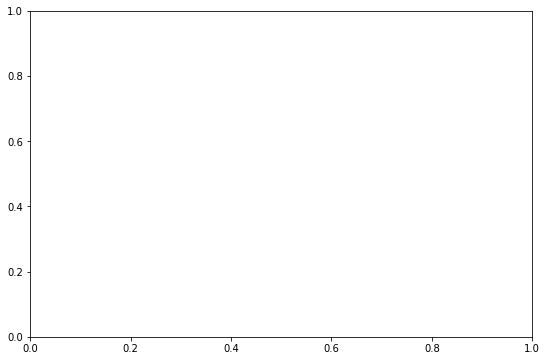

In [74]:
corr = df1.corr()
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(corr, annot=True, ax=ax)

In [84]:
df2 = df[['match', 'sports']]
df2

,match,sports
0,No,Very
1,No,Very
2,Yes,Very
3,Yes,Very
4,Yes,Very
5,No,Very
6,No,Very
7,No,Very
8,Yes,Very
9,No,Very


ValueError: zero-size array to reduction operation minimum which has no identity

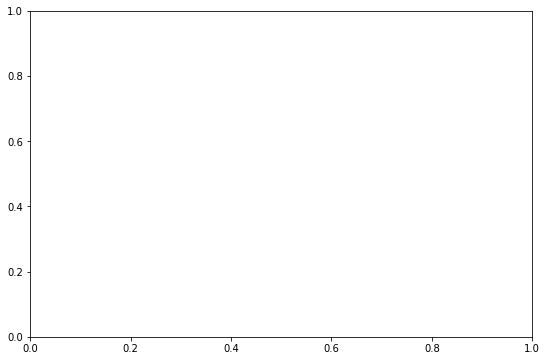

In [89]:
corr = df2.corr()
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(corr, annot=True, ax=ax)

In [88]:
df2.isnull().sum()

match     0
sports    0
dtype: int64

In [87]:
df2 = df2.dropna()

In [90]:
df2

,match,sports
0,No,Very
1,No,Very
2,Yes,Very
3,Yes,Very
4,Yes,Very
5,No,Very
6,No,Very
7,No,Very
8,Yes,Very
9,No,Very


In [91]:
df = pd.read_excel("D:\DataScience\DataSet\Speed Dating Data.xlsx", encoding='ISO-8859-1')
df.describe()

,wave,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field_cd,race,imprace,imprelig,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,you_call,them_cal
count,8378.000000,8368.000000,8378.000000,8220.000000,8378.000000,8274.000000,8305.000000,8289.000000,8289.000000,8289.000000,8280.000000,8271.000000,8249.000000,8378.000000,8166.000000,8091.000000,8072.000000,8018.000000,7656.000000,7302.000000,8128.000000,8060.000000,7993.000000,8283.000000,8296.000000,8315.000000,8299.000000,8299.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8270.000000,8248.000000,8147.000000,8072.000000,8053.000000,7999.000000,7637.000000,7282.000000,8109.000000,8040.000000,7974.000000,7176.000000,3959.000000,3959.000000
mean,11.350919,283.863767,0.164717,0.196010,0.395799,26.364999,2.756653,22.495347,17.396867,20.270759,17.459714,10.685375,11.845930,0.419551,6.190411,7.175256,7.369301,6.400599,6.778409,5.474870,6.134498,5.208251,1.960215,26.358928,7.662488,2.757186,3.784793,3.651645,6.421403,4.574244,6.243168,7.784885,6.984039,6.710036,5.729141,3.879323,5.750181,7.679081,5.294800,6.777267,7.915840,6.821161,7.848730,5.626481,4.331681,5.534433,6.187971,7.171705,7.366571,6.399675,6.778774,5.472329,6.130127,5.207525,0.951843,3.212695,0.776206,0.977772
std,5.995903,158.584899,0.370947,0.303539,0.489051,3.563648,1.230689,12.569802,7.044003,6.782895,6.085526,6.126544,6.362746,0.493515,1.950305,1.740575,1.550501,1.954078,1.794080,2.156163,1.841258,2.129354,0.245925,3.566763,3.758935,1.230905,2.845708,2.805237,2.622646,2.804207,2.422682,1.757602,2.055403,2.266090,2.571208,2.620735,2.504027,2.009840,2.527949,2.237223,1.702702,2.158058,1.794287,2.612222,2.719240,1.734822,1.950344,1.741646,1.551680,1.954990,1.795916,2.157787,1.841129,2.131630,0.990201,2.448540,1.612993,1.383331
min,1.000000,1.000000,0.000000,-0.830000,0.000000,18.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,18.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000000,154.000000,0.000000,-0.020000,0.000000,24.000000,2.000000,15.000000,15.000000,17.390000,15.000000,5.000000,9.520000,0.000000,5.000000,6.000000,6.000000,5.000000,6.000000,4.000000,5.000000,4.000000,2.000000,24.000000,5.000000,2.000000,1.000000,1.000000,4.000000,2.000000,5.000000,7.000000,6.000000,5.000000,4.000000,2.000000,4.000000,7.000000,3.000000,5.000000,7.000000,5.000000,7.000000,4.000000,2.000000,5.000000,5.000000,6.000000,6.000000,5.000000,6.000000,4.000000,5.000000,4.000000,0.000000,2.000000,0.000000,0.000000
50%,11.000000,281.000000,0.000000,0.210000,0.000000,26.000000,2.000000,20.000000,18.370000,20.000000,18.000000,10.000000,10.640000,0.000000,6.000000,7.000000,7.000000,7.000000,7.000000,6.000000,6.000000,5.000000,2.000000,26.000000,8.000000,2.000000,3.000000,3.000000,7.000000,4.000000,6.000000,8.000000,7.000000,7.000000,6.000000,3.000000,6.000000,8.000000,6.000000,7.000000,8.000000,7.000000,8.000000,6.000000,4.000000,6.000000,6.000000,7.000000,7.000000,7.000000,7.000000,6.000000,6.000000,5.000000,0.000000,3.000000,0.000000,1.000000
75%,15.000000,408.000000,0.000000,0.430000,1.000000,28.000000,4.000000,25.000000,20.000000,23.810000,20.000000,15.000000,16.000000,1.000000,8.000000,8.000000,8.000000,8.000000,8.000000,7.000000,7.000000,7.000000,2.000000,28.00

In [97]:
df2 = df[['match', 'sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga']]
df2

,match,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga
0,0,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0
1,0,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0
2,1,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0
3,1,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0
4,1,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0
5,0,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0
6,0,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0
7,0,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0
8,1,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0
9,0,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0


In [99]:
df2.isnull().sum()

match         0
sports      108
tvsports    108
exercise    108
dining      108
museums     108
art         108
hiking      108
gaming      108
clubbing    108
reading     108
tv          108
theater     108
movies      108
concerts    108
music       108
shopping    108
yoga        108
dtype: int64

In [100]:
df2 = df2.dropna()

In [101]:
df2.isnull().sum()

match       0
sports      0
tvsports    0
exercise    0
dining      0
museums     0
art         0
hiking      0
gaming      0
clubbing    0
reading     0
tv          0
theater     0
movies      0
concerts    0
music       0
shopping    0
yoga        0
dtype: int64

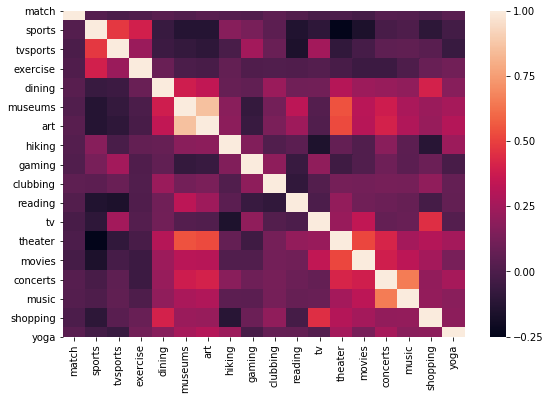

In [103]:
corr = df2.corr()
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(corr, ax=ax)